# Color Grabber
Grab bounding boxes from colored png input:

In [34]:
from pathlib import Path
from PIL import Image
import numpy as np
import cv2
import csv
import re

# Path to your images directory
images_dir = Path('../Data/sample_png_labels/regions')

# Define color ranges for green and blue in BGR format for OpenCV
lower_green = np.array([0, 30, 0])
upper_green = np.array([0, 255, 0])

lower_blue = np.array([0, 0, 30])
upper_blue = np.array([0, 0, 255])

def load_image(image_path):
    """Loads an image and converts it to a numpy array."""
    with Image.open(image_path) as img:
        return np.array(img)

def extract_bounding_boxes(image_np, min_area=100):
    """Extracts bounding boxes for green and blue regions."""
    try:
        # Convert the image to HSV color space (assuming thresholds are in HSV)
        hsv_image = cv2.cvtColor(image_np, cv2.COLOR_BGR2HSV)

        # Define HSV ranges for green and blue colors with correct data type
        lower_green = np.array([35, 100, 100], dtype=np.uint8)
        upper_green = np.array([85, 255, 255], dtype=np.uint8)
        lower_blue = np.array([100, 100, 100], dtype=np.uint8)
        upper_blue = np.array([140, 255, 255], dtype=np.uint8)

        # Create masks for green and blue regions
        green_mask = cv2.inRange(hsv_image, lower_green, upper_green)
        blue_mask = cv2.inRange(hsv_image, lower_blue, upper_blue)

        # Initialize lists to store bounding boxes
        green_bounding_boxes = []
        blue_bounding_boxes = []

        # Find contours (bounding boxes) for green regions if any green pixels are detected
        if np.any(green_mask):  
            green_contours, _ = cv2.findContours(green_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            green_bounding_boxes = [
                cv2.boundingRect(contour) for contour in green_contours
                if cv2.boundingRect(contour)[2] * cv2.boundingRect(contour)[3] >= min_area
            ]

        # Find contours (bounding boxes) for blue regions if any blue pixels are detected
        if np.any(blue_mask):  
            blue_contours, _ = cv2.findContours(blue_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            blue_bounding_boxes = [
                cv2.boundingRect(contour) for contour in blue_contours
                if cv2.boundingRect(contour)[2] * cv2.boundingRect(contour)[3] >= min_area
            ]

        return green_bounding_boxes, blue_bounding_boxes

    except Exception as e:
        # Indicate an error during processing, to be handled by calling code
        print(f"Error processing image: {e}")
        return None  # Return None if an error occurs


# Define minimum and maximum size thresholds
min_width = 20  # Minimum width for bounding boxes to be included
min_height = 15  # Minimum height for bounding boxes to be included
max_width = 200  # Maximum width for bounding boxes to be included
max_height = 150  # Maximum height for bounding boxes to be included

# List to store names of skipped images
skipped_images = []

# Prepare the CSV file
output_csv_path = 'bounding_boxes.csv'
with open(output_csv_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Frame', 'TopLeftCornerX', 'TopLeftCornerY', 'Length', 'Height'])

    # Process each image in the directory
    for image_file in sorted(images_dir.iterdir()):
        if image_file.suffix.lower() in [".tif", ".jpg", ".png"]:  # Supported formats
            # Extract the frame number from the filename using a regular expression
            match = re.search(r'\d+', image_file.stem)  # Looks for digits in the file name
            if match:
                frame_number = int(match.group())  # Convert to integer for the frame number
            else:
                continue  # Skip files that don't contain a number in the name
            
            try:
                # Load the image
                image_np = load_image(image_file)
                
                # Extract bounding boxes for green and blue regions
                green_boxes, blue_boxes = extract_bounding_boxes(image_np)

                # Skip the image if no boxes are found
                if not green_boxes and not blue_boxes:
                    continue

                # Write green boxes to CSV, skipping small and large boxes
                for (x, y, w, h) in green_boxes:
                    if min_width <= w <= max_width and min_height <= h <= max_height:
                        writer.writerow([frame_number, x + 0.5, y + 0.5, w, h])
                
                # Write blue boxes to CSV, skipping small and large boxes
                for (x, y, w, h) in blue_boxes:
                    if min_width <= w <= max_width and min_height <= h <= max_height:
                        writer.writerow([frame_number, x + 0.5, y + 0.5, w, h])

            except Exception as e:
                # Add the image filename to skipped images list if an error occurs
                print(f"Skipping {image_file} due to error: {e}")
                skipped_images.append(image_file.name)

# Write skipped images to a text file
with open("skipped_images.txt", "w") as skipped_file:
    for image in skipped_images:
        skipped_file.write(f"{image}\n")

print("Skipped images have been written to skipped_images.txt")


error: OpenCV(4.10.0) /home/conda/feedstock_root/build_artifacts/libopencv_1721302265315/work/modules/core/src/arithm.cpp:1875: error: (-209:Sizes of input arguments do not match) The lower boundary is neither an array of the same size and same type as src, nor a scalar in function 'inRange'


## Display outcome of CSV creation:

../Data/sample_png_labels/actual/render0001.png
loading ../Data/sample_png_labels/actual/render0001.png


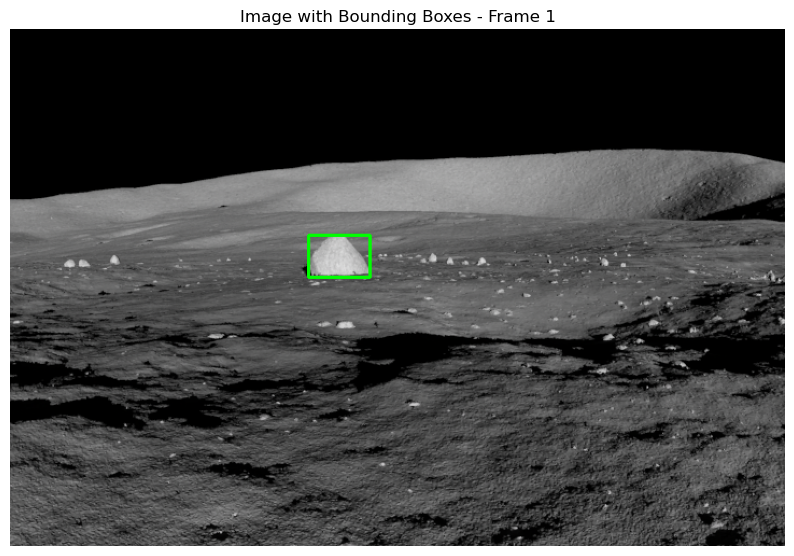

../Data/sample_png_labels/actual/render0002.png
loading ../Data/sample_png_labels/actual/render0002.png


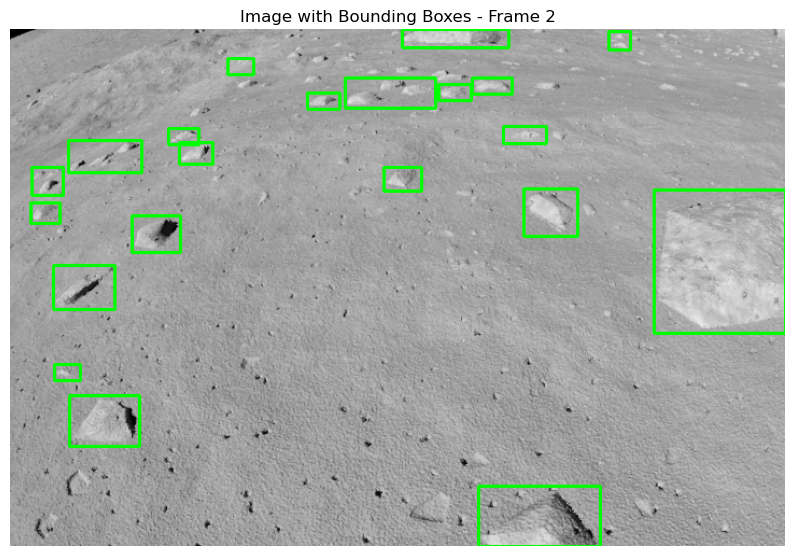

../Data/sample_png_labels/actual/render0003.png
loading ../Data/sample_png_labels/actual/render0003.png


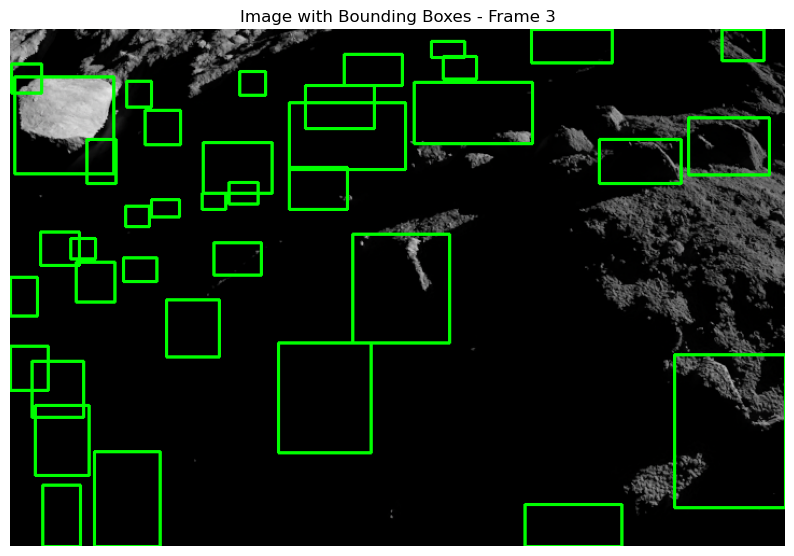

../Data/sample_png_labels/actual/render0005.png
loading ../Data/sample_png_labels/actual/render0005.png


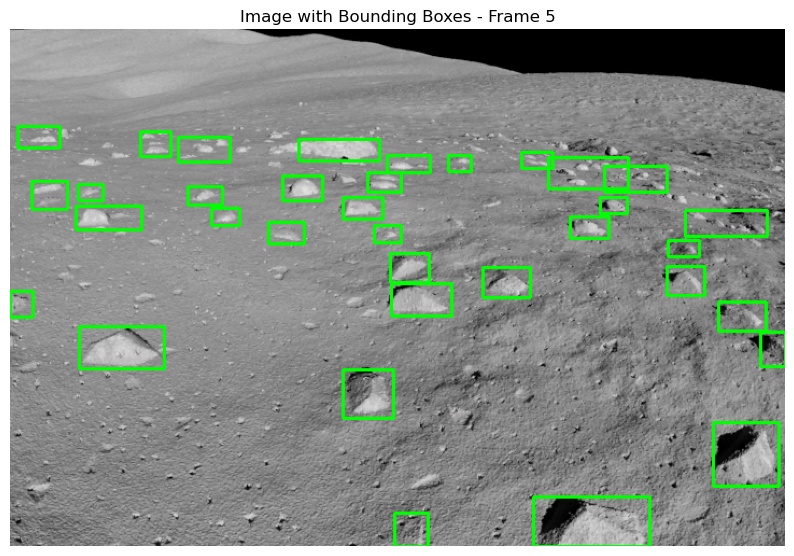

../Data/sample_png_labels/actual/render0006.png
loading ../Data/sample_png_labels/actual/render0006.png


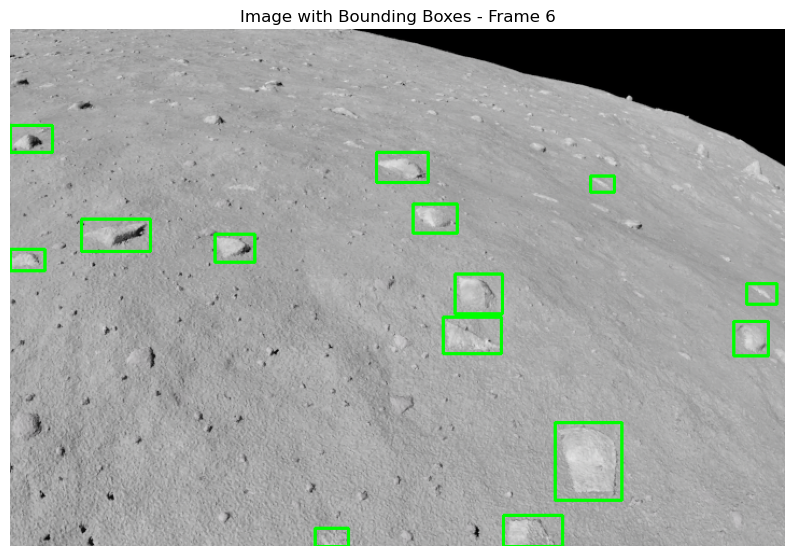

../Data/sample_png_labels/actual/render0007.png
loading ../Data/sample_png_labels/actual/render0007.png


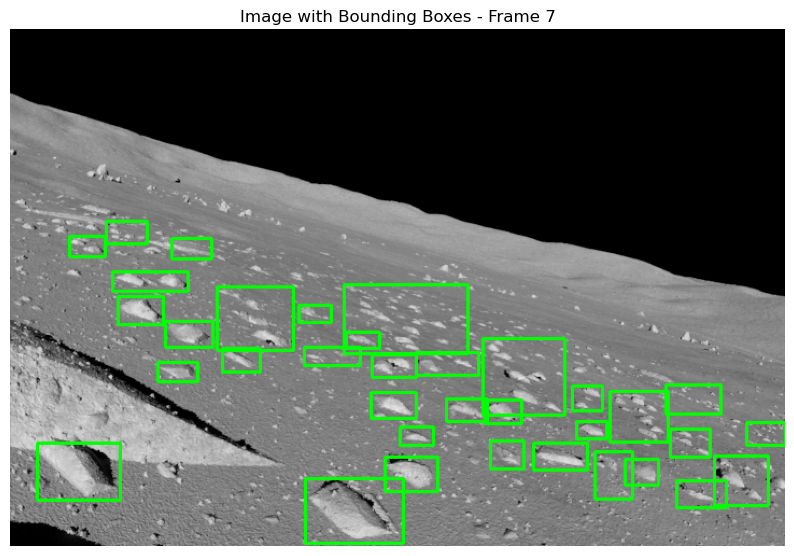

../Data/sample_png_labels/actual/render0008.png
loading ../Data/sample_png_labels/actual/render0008.png


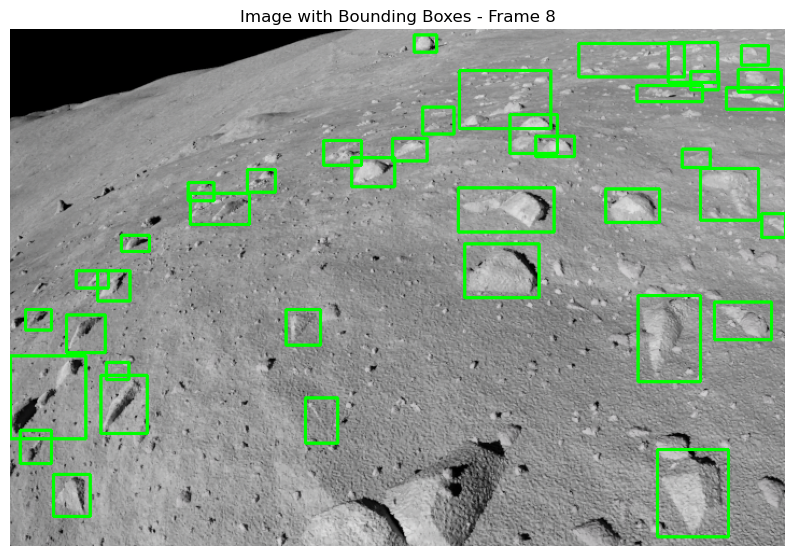

../Data/sample_png_labels/actual/render0117.png
../Data/sample_png_labels/actual/render0118.png
../Data/sample_png_labels/actual/render0119.png
../Data/sample_png_labels/actual/render0120.png
../Data/sample_png_labels/actual/render0122.png
../Data/sample_png_labels/actual/render0123.png
../Data/sample_png_labels/actual/render0124.png
loading ../Data/sample_png_labels/actual/render0124.png


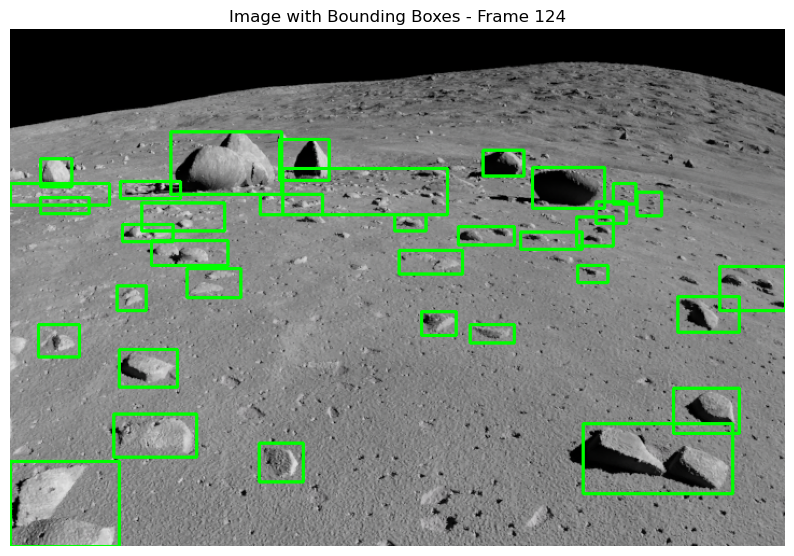

../Data/sample_png_labels/actual/render0125.png
loading ../Data/sample_png_labels/actual/render0125.png


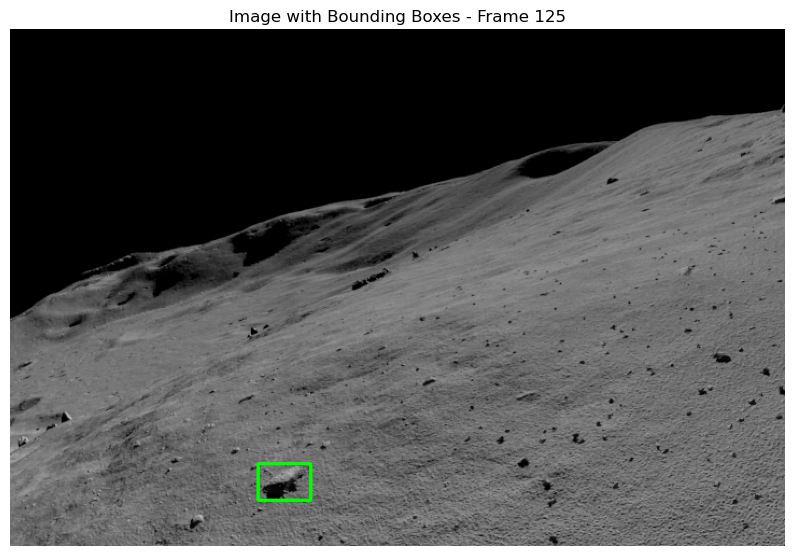

../Data/sample_png_labels/actual/render0126.png
loading ../Data/sample_png_labels/actual/render0126.png


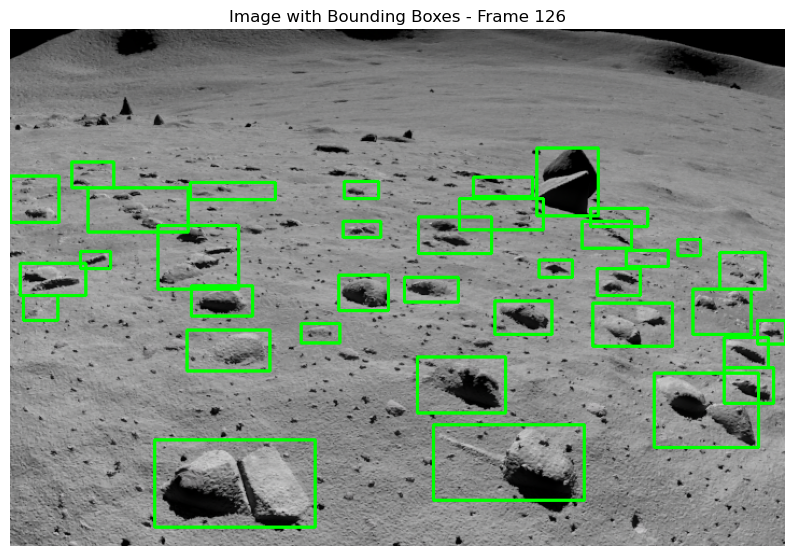

../Data/sample_png_labels/actual/render0127.png
loading ../Data/sample_png_labels/actual/render0127.png


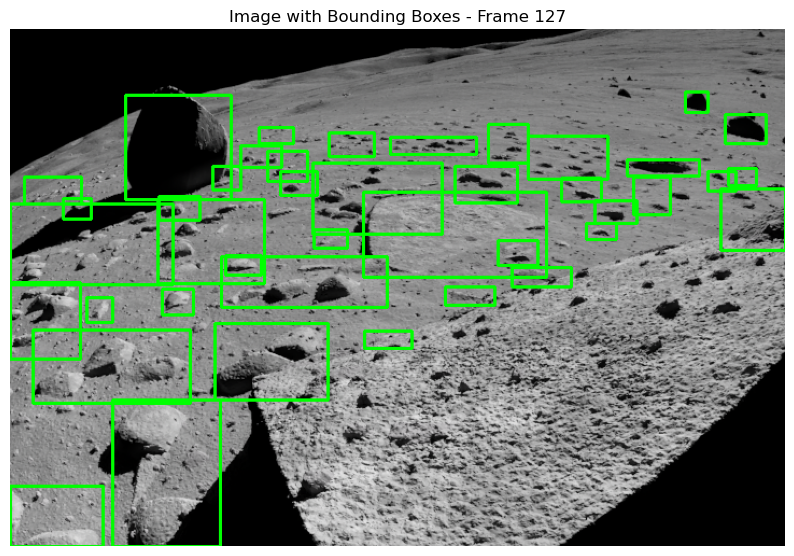

../Data/sample_png_labels/actual/render0128.png
loading ../Data/sample_png_labels/actual/render0128.png


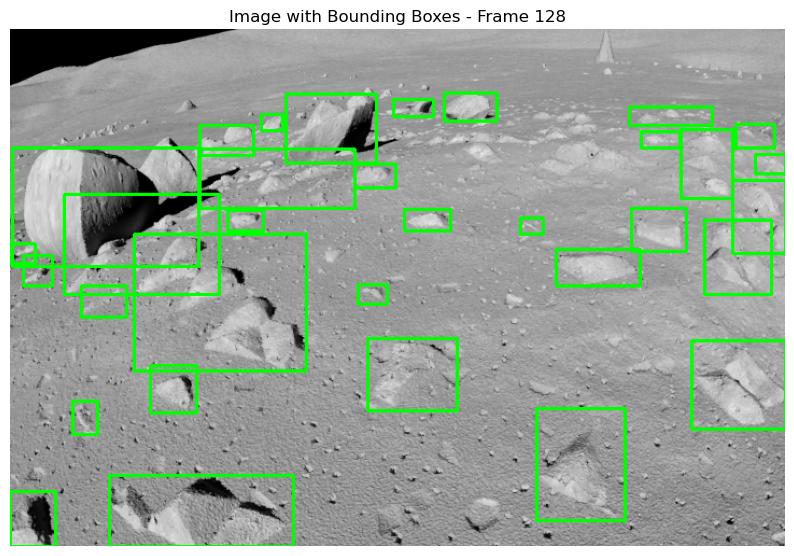

../Data/sample_png_labels/actual/render0129.png
loading ../Data/sample_png_labels/actual/render0129.png


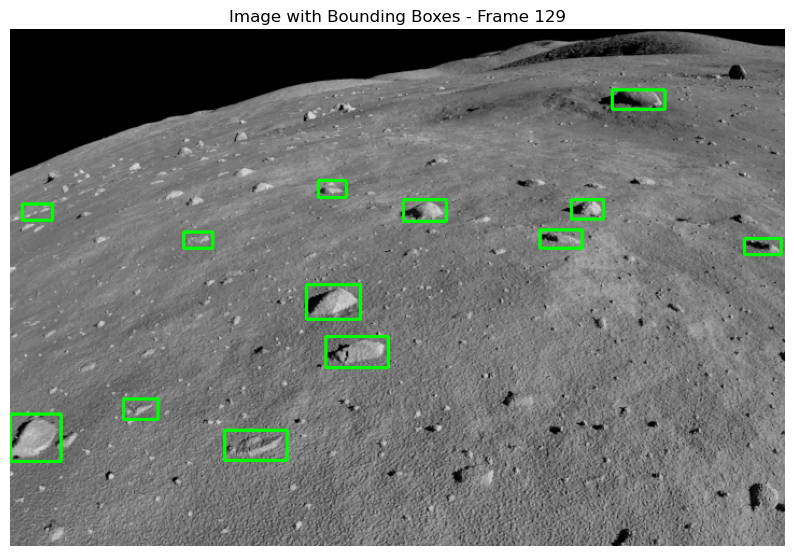

../Data/sample_png_labels/actual/render0130.png
loading ../Data/sample_png_labels/actual/render0130.png


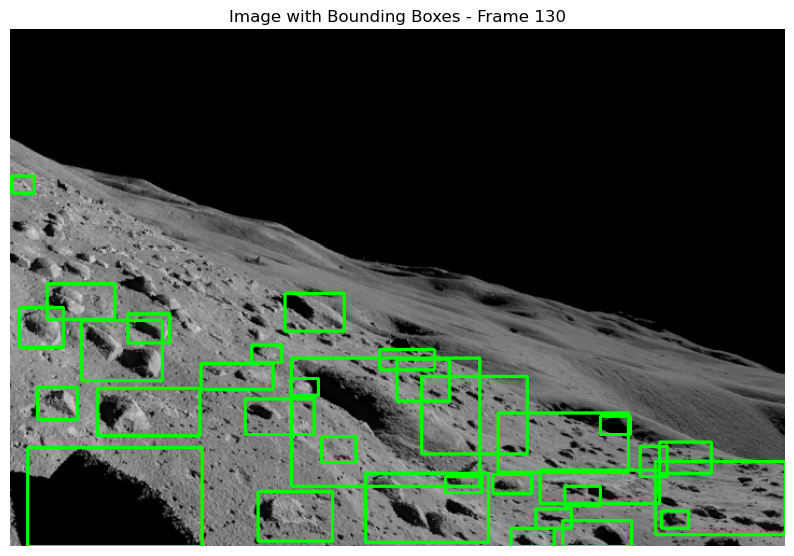

../Data/sample_png_labels/actual/render0131.png
loading ../Data/sample_png_labels/actual/render0131.png


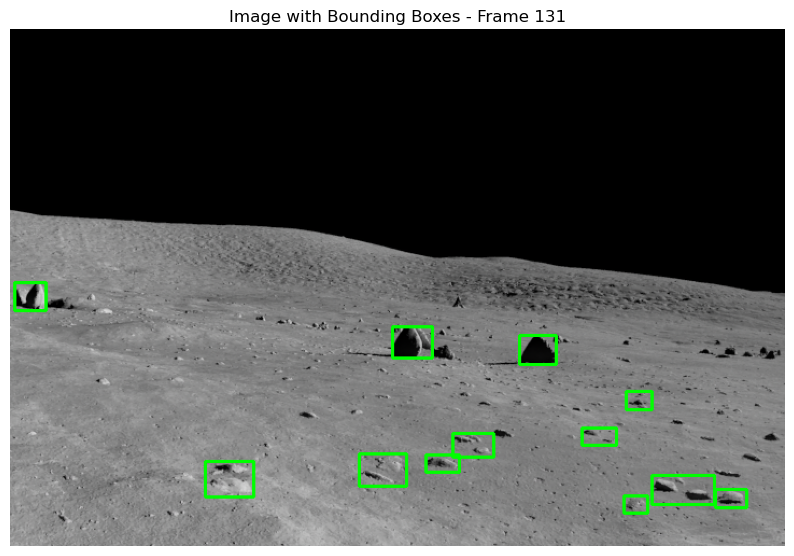

../Data/sample_png_labels/actual/render0132.png
loading ../Data/sample_png_labels/actual/render0132.png


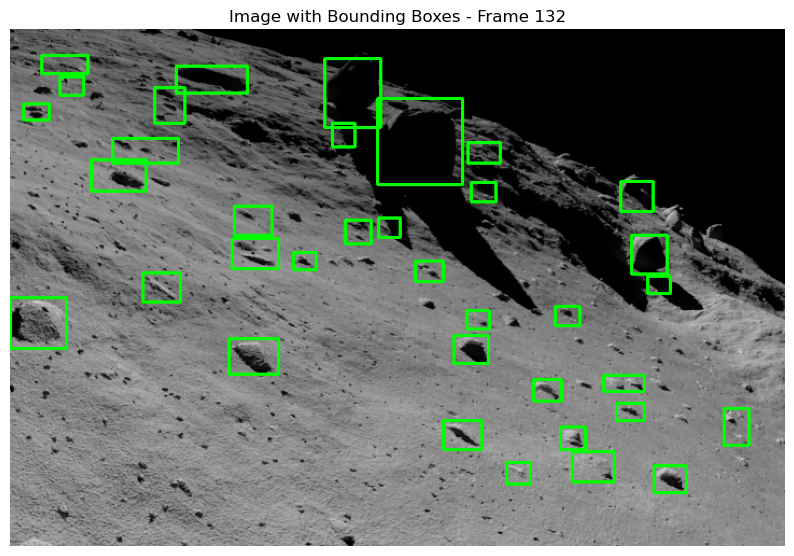

../Data/sample_png_labels/actual/render0133.png
loading ../Data/sample_png_labels/actual/render0133.png


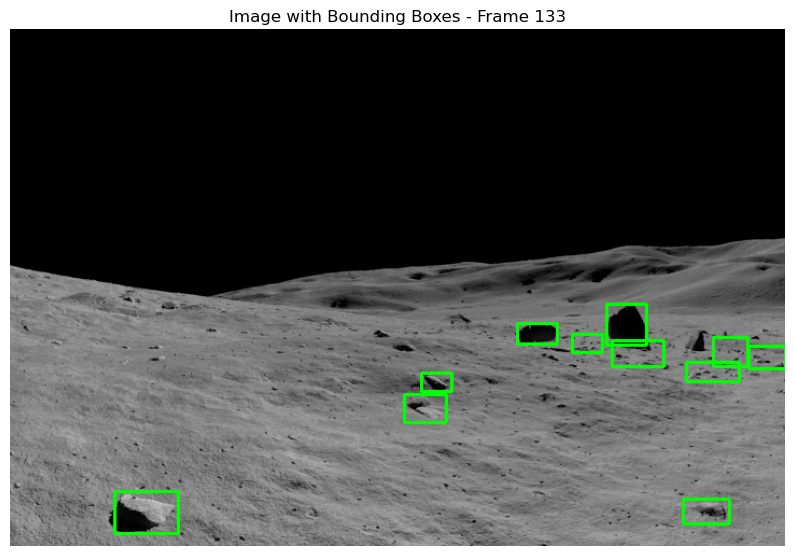

../Data/sample_png_labels/actual/render0134.png
loading ../Data/sample_png_labels/actual/render0134.png


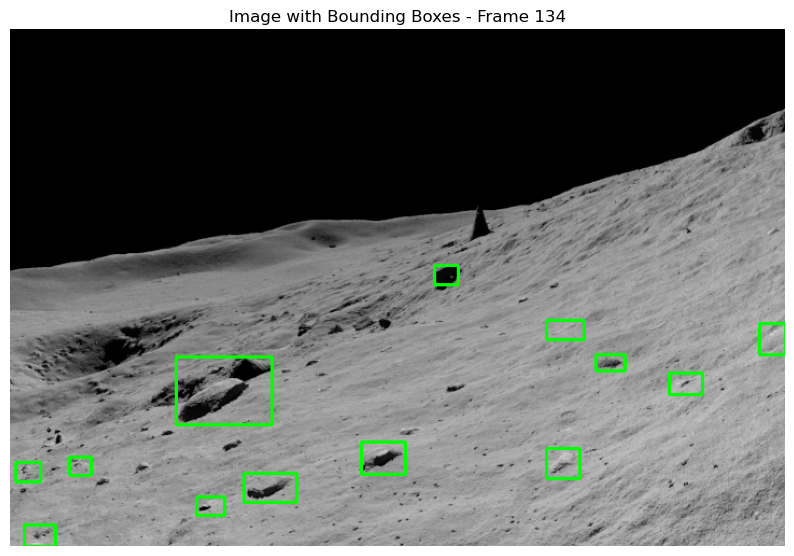

../Data/sample_png_labels/actual/render0135.png
loading ../Data/sample_png_labels/actual/render0135.png


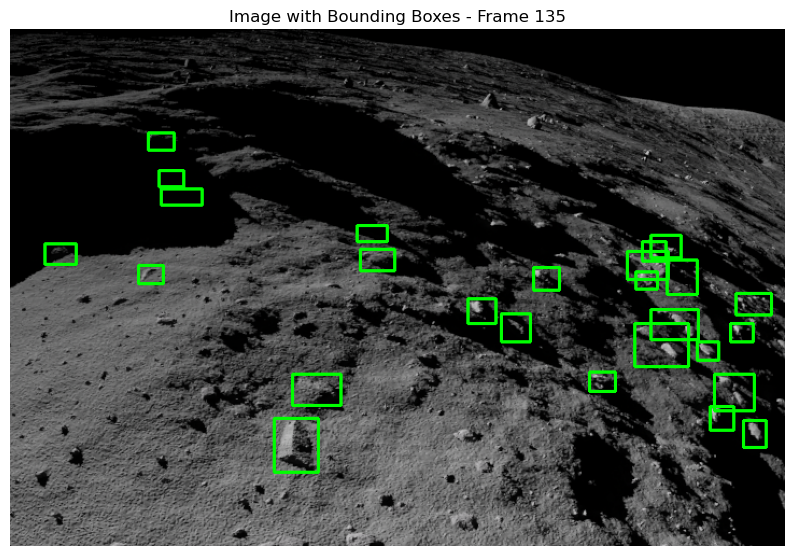

../Data/sample_png_labels/actual/render0136.png
loading ../Data/sample_png_labels/actual/render0136.png


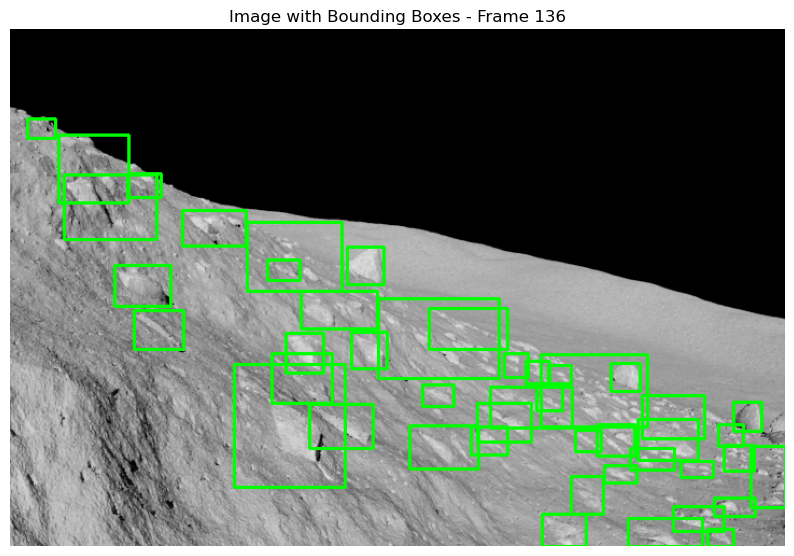

../Data/sample_png_labels/actual/render0137.png
loading ../Data/sample_png_labels/actual/render0137.png


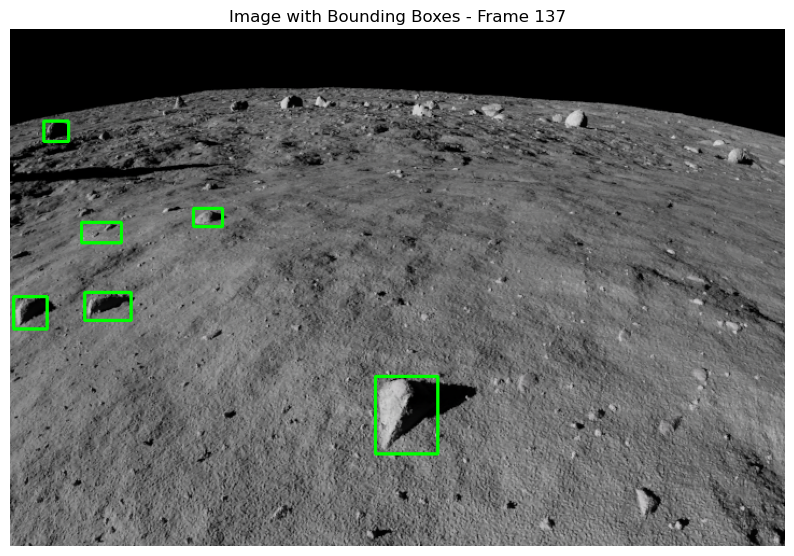

../Data/sample_png_labels/actual/render0138.png
loading ../Data/sample_png_labels/actual/render0138.png


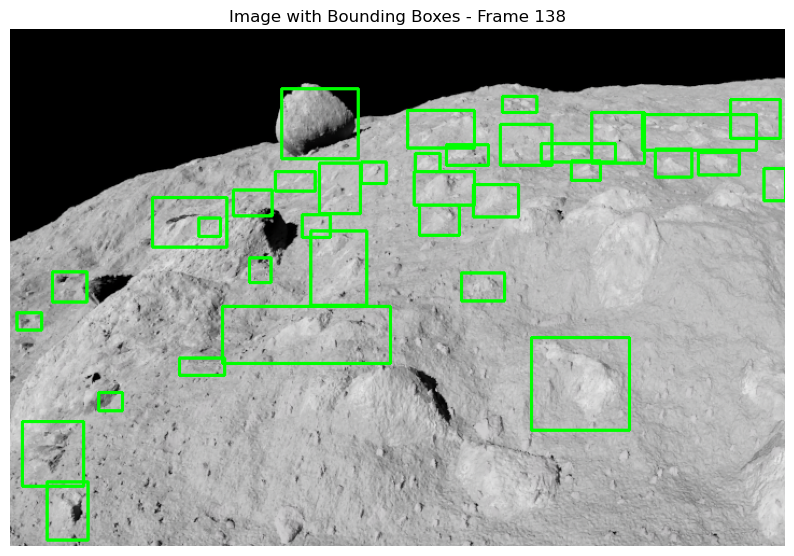

../Data/sample_png_labels/actual/render0139.png
loading ../Data/sample_png_labels/actual/render0139.png


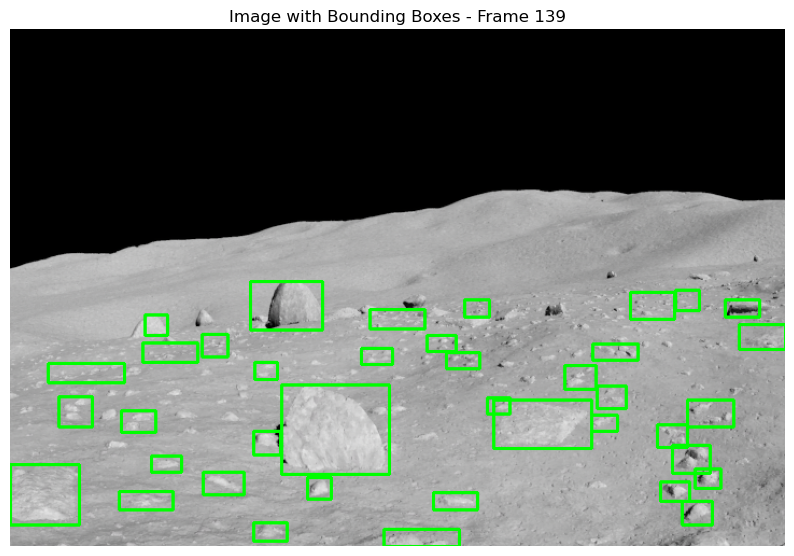

../Data/sample_png_labels/actual/render0140.png
loading ../Data/sample_png_labels/actual/render0140.png


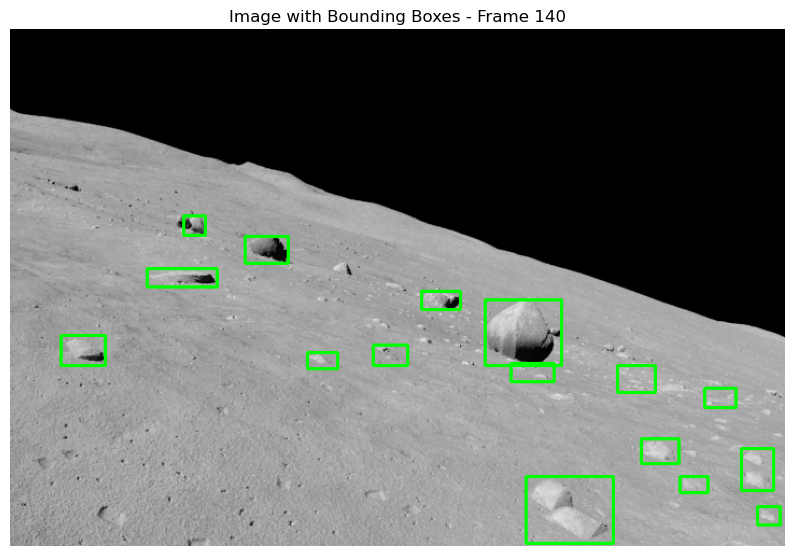

In [32]:
%matplotlib inline

from pathlib import Path
from PIL import Image
import numpy as np
import cv2
import csv
import matplotlib.pyplot as plt

# Path to your images directory and the bounding boxes CSV file
images_dir = Path('../Data/sample_png_labels/actual')
csv_path = 'bounding_boxes.csv'

def load_image(image_path):
    """Loads an image and converts it to a numpy array."""
    with Image.open(image_path) as img:
        return np.array(img)

def load_bounding_boxes(csv_path):
    """Loads bounding boxes from a CSV file and organizes them by frame number."""
    bounding_boxes = {}
    with open(csv_path, newline='') as csvfile:
        reader = csv.DictReader(csvfile)
        for row in reader:
            frame = int(row['Frame'])
            x = float(row['TopLeftCornerX'])
            y = float(row['TopLeftCornerY'])
            w = int(row['Length'])
            h = int(row['Height'])
            
            # Store bounding boxes in a dictionary with frame numbers as keys
            if frame not in bounding_boxes:
                bounding_boxes[frame] = []
            bounding_boxes[frame].append((x, y, w, h))
    return bounding_boxes

def display_bounding_boxes(image_np, boxes):
    """Displays bounding boxes on the image."""
    output_image = image_np.copy()
    for (x, y, w, h) in boxes:
        cv2.rectangle(output_image, (int(x), int(y)), (int(x + w), int(y + h)), (0, 255, 0), 2)
    return output_image

# Load bounding boxes from the CSV
bounding_boxes = load_bounding_boxes(csv_path)

# Process each image and overlay bounding boxes
for frame_number, boxes in bounding_boxes.items():
    # Construct the image file path
    image_file = images_dir / f"render{frame_number:04}.png"
    print(image_file)
    if image_file.exists():
        print("loading", image_file)
        # Load the image
        image_np = load_image(image_file)
        
        # Display bounding boxes on the image
        output_image = display_bounding_boxes(image_np, boxes)
        
        # Show the resulting image
        plt.figure(figsize=(10, 8))
        plt.imshow(output_image)
        plt.axis('off')
        plt.title(f"Image with Bounding Boxes - Frame {frame_number}")
        plt.show()
